This notebook is used as a "first look" of the kaggle competition ["Google Landmark Recognition 2019"](https://www.kaggle.com/c/landmark-recognition-2019) test set. 

Because the available test set of the 2020 comeptition is witouth its ground truth table we will use 2019 competition test set to evaluate our algorithm. 

The 2019 competition test set was released as CSV file with three columns: id (16-character string), landmarks (space-separated list of integer landmark IDs, or empty if no landmark from the dataset is depicted) and Usage (either "Public" or "Private", referring to which subset the image belongs to).

It can be found [here.](https://github.com/cvdfoundation/google-landmark)

In [2]:
# imports for code 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cv2 

In [3]:
# load the test data csv file as data frame
test_df = pd.read_csv("C:/Users/Matan/Desktop/projectB/data/test/recognition_solution_v2.1.csv") 
test_df

,id,landmarks,Usage
0,e324e0f3e6d9e504,NaN,Private
1,d9e17c5f3e0c47b3,NaN,Private
2,1a748a755ed67512,NaN,Public
3,537bf9bdfccdafea,NaN,Private
4,13f4c974274ee08b,NaN,Private
...,...,...,...
117572,e351c3e672c25fbd,190441,Public
117573,5426472625271a4d,NaN,Public
117574,7b6a585405978398,NaN,Public
117575,d885235ba249cf5d,NaN,Public


As we can see there are a lot of NaN values in the landmarks column. That mean that a lot of the objects in the test set are not landmarks but non-landmarks.

We would like to look at the images from the train set:

In [4]:
# load test image path and labels as a dictionary and then convet to dataframe 
test_path_label_dict = {'image': [], 'target': []}
for i in range(test_df.shape[0]):
    test_path_label_dict['image'].append(
        "D:/dataset/test" + '/' + 
        test_df['id'][i][0] + '/' + 
        test_df['id'][i][1] + '/' +
        test_df['id'][i][2] + '/' +
        test_df['id'][i] + ".jpg")
    test_path_label_dict['target'].append(test_df['landmarks'][i])

test_path_label_df = pd.DataFrame(test_path_label_dict)

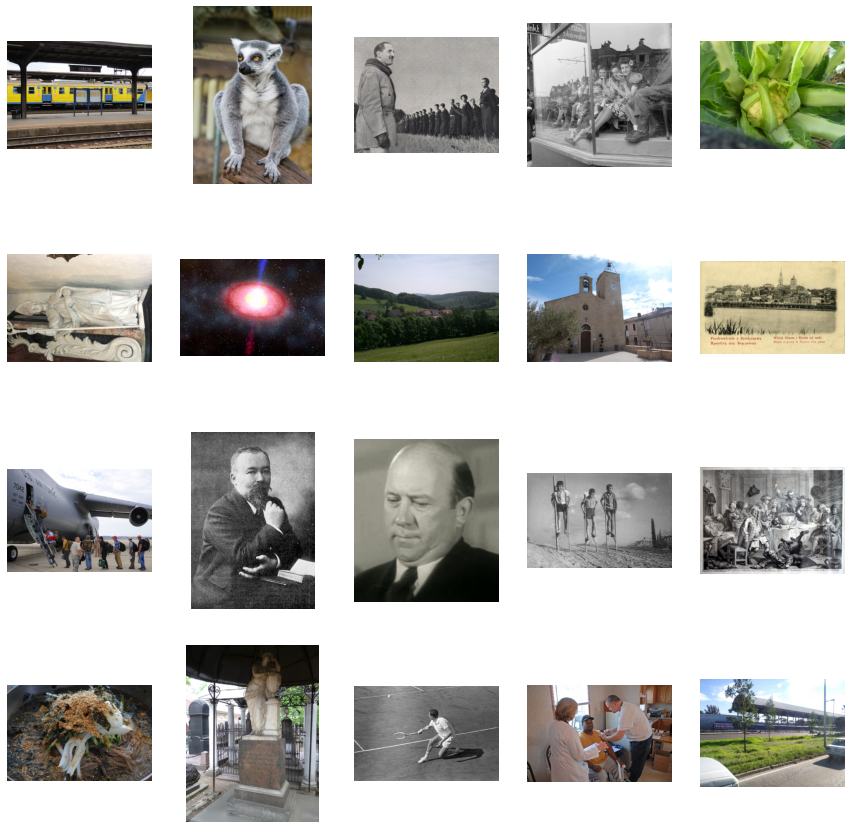

In [5]:
images = []

for i in range(1,21):    
    img = cv2.imread(test_path_label_df.image[1:21][i])   
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)
f, ax = plt.subplots(4,5, figsize=(15,15))
for i, img in enumerate(images):
        ax[i//5, i%5].imshow(img)
        ax[i//5, i%5].axis('off')

As we saw from the dataframe, the train set contain a lot of images that are not landmark at all but a variety of images including protrait, group of people, animals, plants, food, etc..

We will look now only on the landmarks inside the test set. 

In [6]:
test_df_no_NaN = test_df.dropna()
test_df_no_NaN = test_df_no_NaN.reset_index()
test_df_no_NaN = test_df_no_NaN.drop('index', axis=1)
test_df_no_NaN

,id,landmarks,Usage
0,ed85edf01da02f26,179171,Public
1,4d5d0e6264e6c7e0,124703,Public
2,e153105026e18260,150977,Public
3,db635e33c17229bb,92607,Private
4,03b1294a0fa46763,184268,Private
...,...,...,...
1967,4e4e7fdca971442f,95197,Private
1968,efd80af423defb09,162786,Public
1969,90e066e0d0ac2827,188823,Private
1970,ee95080bf6187d9a,127232,Public


As we can see, most of the objects in the test set are non-landmarks.

We would like to look at the images from the test set that identified as landmarks:

In [7]:
# load test image (without NaN) path and labels as a dictionary and then convet to dataframe 
test_no_NaN_path_label_dict = {'image': [], 'target': []}
for i in range(test_df_no_NaN.shape[0]):
    test_no_NaN_path_label_dict['image'].append(
        "D:/dataset/test" + '/' +  
        test_df_no_NaN['id'][i][0] + '/' + 
        test_df_no_NaN['id'][i][1] + '/' +
        test_df_no_NaN['id'][i][2] + '/' +
        test_df_no_NaN['id'][i] + ".jpg")
    test_no_NaN_path_label_dict['target'].append(test_df_no_NaN['landmarks'][i])

test_no_NaN_path_label_df = pd.DataFrame(test_no_NaN_path_label_dict)

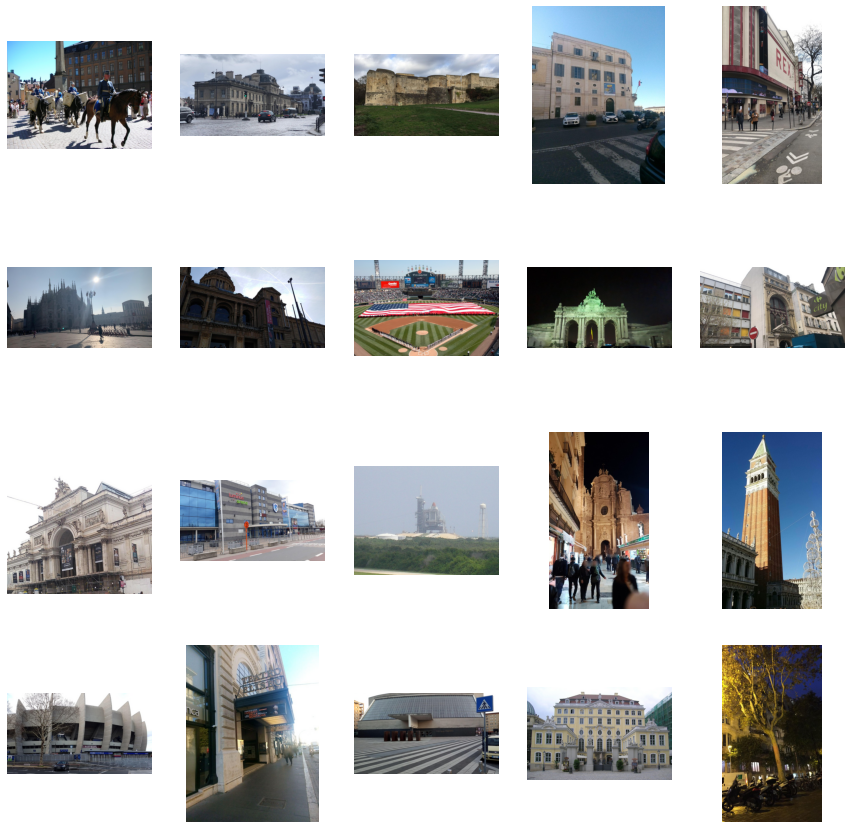

In [8]:
images = []

for i in range(1,21):    
    img = cv2.imread(test_no_NaN_path_label_df.image[1:21][i])   
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img)
f, ax = plt.subplots(4,5, figsize=(15,15))
for i, img in enumerate(images):
        ax[i//5, i%5].imshow(img)
        ax[i//5, i%5].axis('off')

As we can see, all the images above shows a variety of landmarks

We'll now check few of the test set properties: 

In [9]:
print("number of ids is: {}" .format(test_df['id'].size))
print("\nnumber of landmarks ids is: {}" .format(test_df_no_NaN['id'].size))
print("\nnumber of unique values in landmarks column is: {}" .format(test_df['landmarks'].nunique()))

number of ids is: 117577

number of landmarks ids is: 1972

number of unique values in landmarks column is: 849


As we can see, the test set composed out of **117,577 images** that divided into **849 classes**. 
Only **1972 pictures** out of the 117,577 images in the test set are actually landmarkd, e.i. only **1.67 %**  

We would like to look at the different classes in the test set, we we'll start with the top classes: 

In [10]:
print("top 10 classes:\n")
print(test_df_no_NaN['landmarks'].value_counts().head(10))

top 10 classes:

114046 171629    13
158276           12
100782           11
107743           10
113600           10
169083           10
90903            10
161396           10
61105            10
121259 170701    10
Name: landmarks, dtype: int64


As we can see from the top result, some images can relate to more than one class. 
We would like to know how many images can realte to more than one 

In [11]:
# We'll creata new data frame thus if one image relate to more then one class we'll split the classes to other columns.   
new_df = test_df_no_NaN["landmarks"].str.split(" ", n = 10, expand = True) 
print(new_df.shape)

(1972, 4)


As we can see, one image can relate to different classes (up to 4). 

In [12]:
# now we'll concat the four columns to 1 and drop the NaN
concat_df = pd.concat([new_df[0], new_df[1], new_df[2], new_df[3]]).dropna()
concat_df = concat_df.to_frame('landmarks').reset_index()
concat_df = concat_df.drop('index', axis=1)
print("The classes that appear in the test set, seperated:")
concat_df

The classes that appear in the test set, seperated:


,landmarks
0,179171
1,124703
2,150977
3,92607
4,184268
...,...
2309,52006
2310,76017
2311,52006
2312,48571


In [13]:
print(concat_df['landmarks'].value_counts().head(10))

print("\nnumber of unique values in landmarks column is: {}" .format(concat_df['landmarks'].nunique()))

100782    16
185558    16
114046    15
171629    13
158276    12
121008    12
132969    12
47378     12
178061    11
146388    11
Name: landmarks, dtype: int64

number of unique values in landmarks column is: 852


As we can see from the above, when we first split and then concatenate the landmarks coulmn, it changed the amount of recurrence of some classes. It also changed the amount of classes to **852 classes**. 

We would like to plot the classes histogram:

<Figure size 432x288 with 0 Axes>

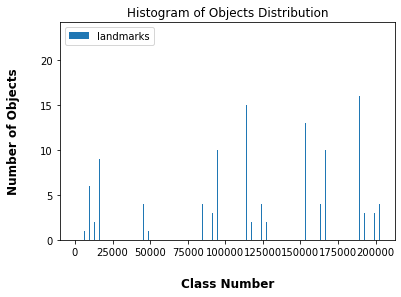

In [14]:
concat_df_float = concat_df.astype(float)
fig = plt.figure()
ax = concat_df_float.plot.hist(bins=852, grid=False, rwidth=0.1)
ax.set_xlabel("Class Number", labelpad=20, weight='bold', size=12)
ax.set_ylabel("Number of Objects", labelpad=20, weight='bold', size=12)
ax.set_title("Histogram of Objects Distribution")
plt.show()

As we can see from the histogram, the classes are scattered across the x axis.  

We would like to inspect the top and bottom classes more carefulley:

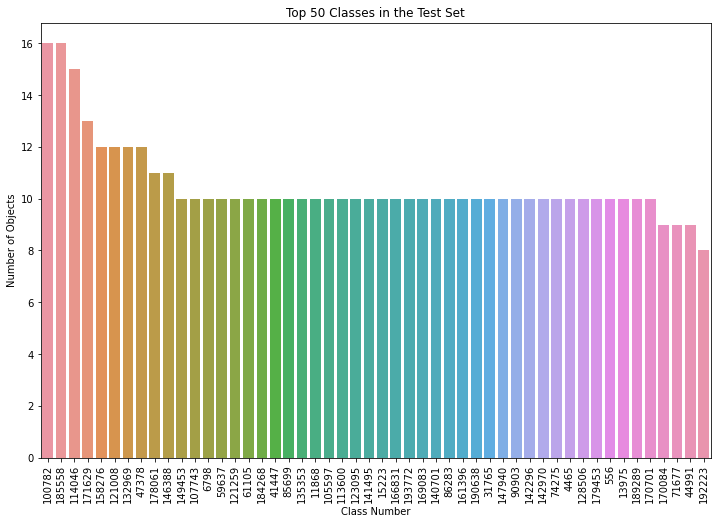

In [15]:
fig2 = plt.figure(figsize = (12,8))
sns.countplot(x=concat_df.landmarks, order = concat_df['landmarks'].value_counts().head(50).index)
plt.xlabel("Class Number")
plt.ylabel("Number of Objects")
plt.title("Top 50 Classes in the Test Set")
plt.xticks(rotation = 90)
plt.show()

We will display some images from some of the top classes: 

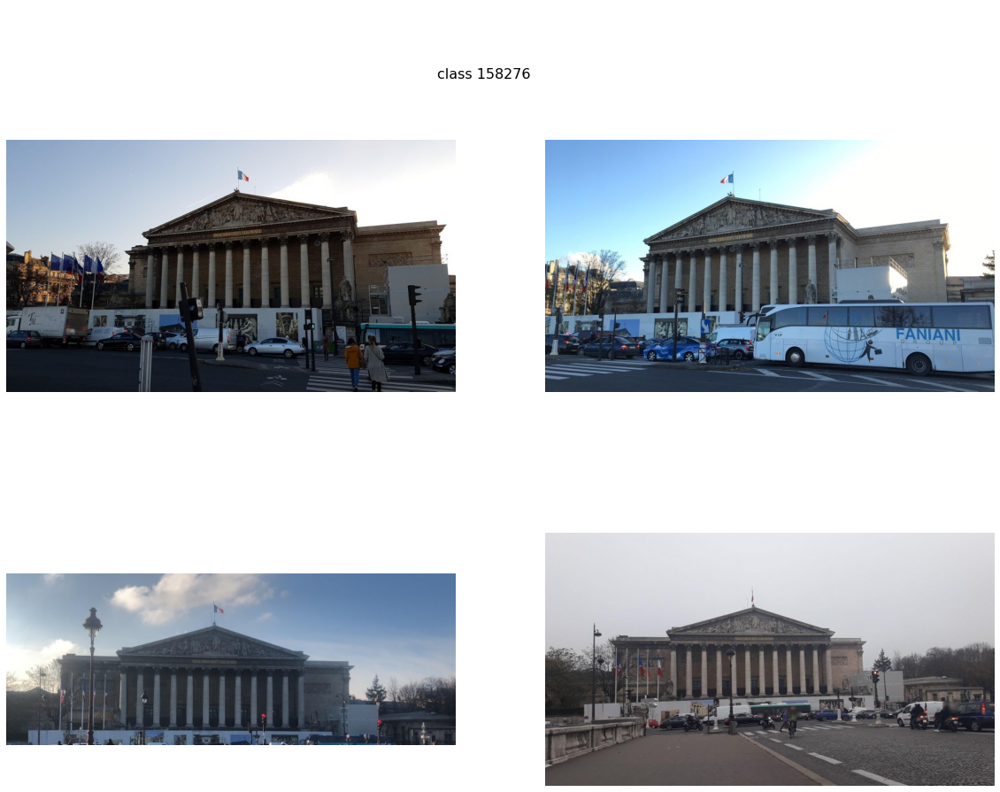

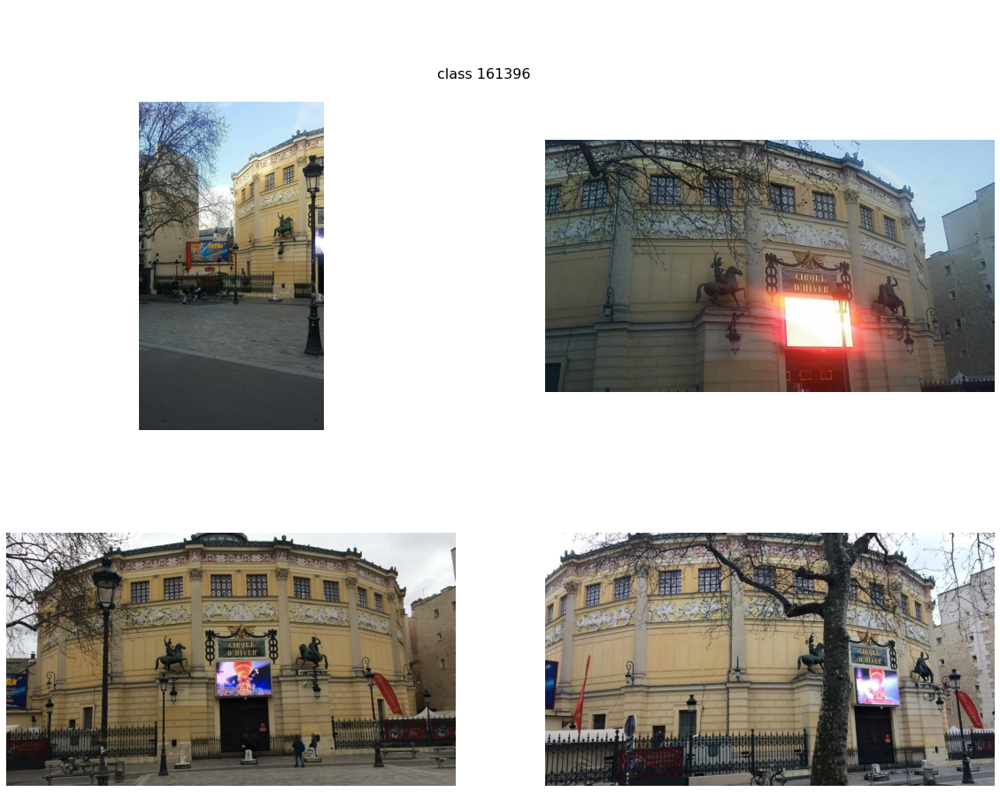

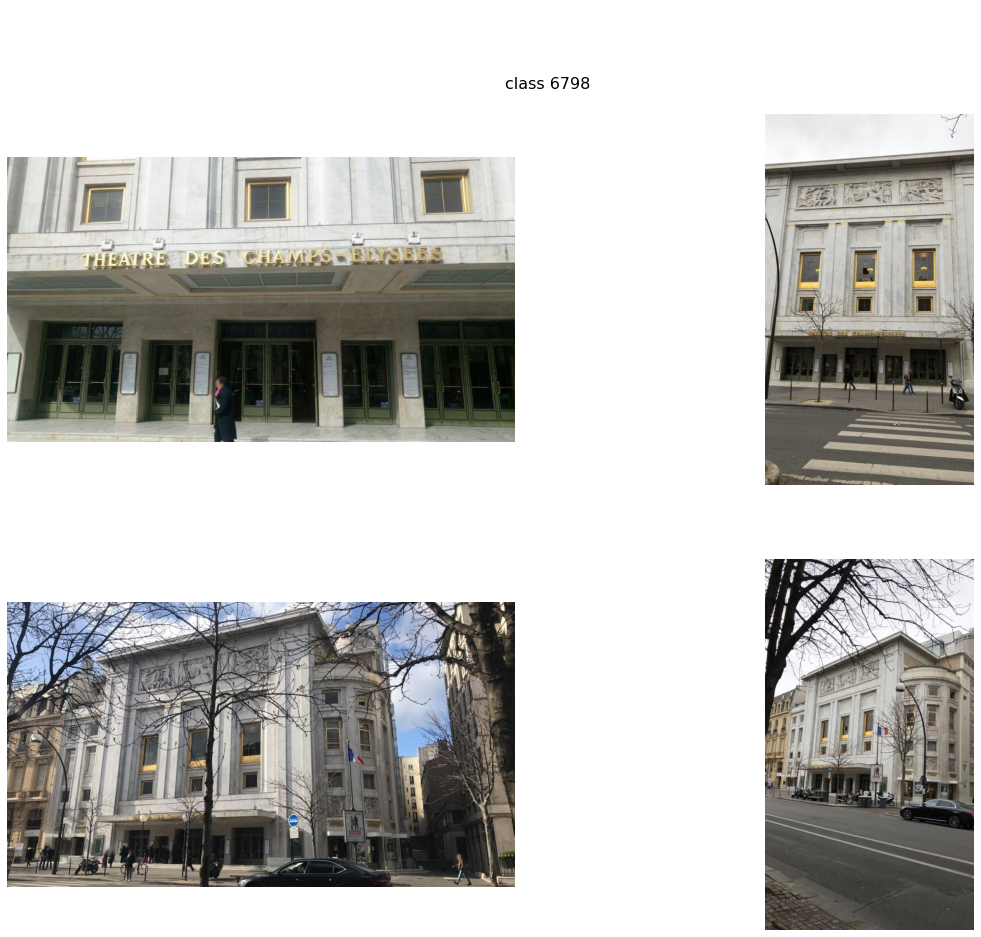

In [38]:
top_classes = (158276, 161396, 6798) # some top classes 

for i in range(len(top_classes)):
    images = []      
    for j in range(4):
        img = cv2.imread(test_no_NaN_path_label_df[test_no_NaN_path_label_df.target == str(top_classes[i])]['image'].values[j])   
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)           
    fig, ax = plt.subplots(2,2,figsize=(20,15))
    fig.suptitle("\n\n\n\nclass {}".format(top_classes[i]), fontsize=16)
    for k, img in enumerate(images):        
        ax[k//2, k%2].imshow(img)
        ax[k//2, k%2].axis('off')

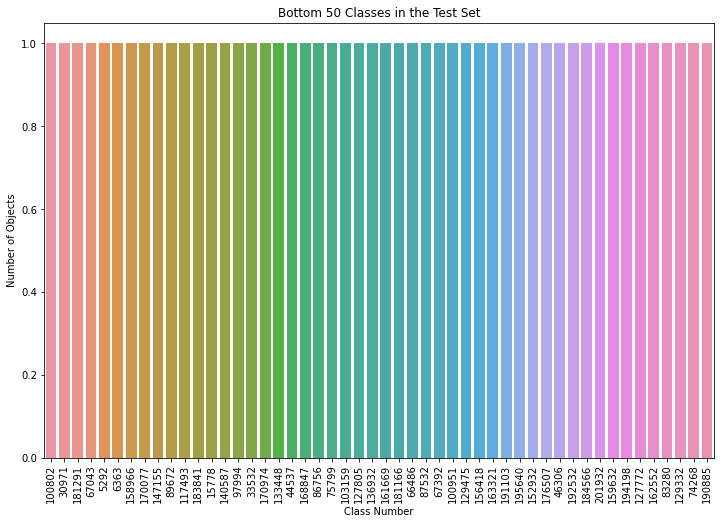

In [17]:
fig2 = plt.figure(figsize = (12,8))
sns.countplot(x=concat_df.landmarks, order = concat_df['landmarks'].value_counts().tail(50).index)
plt.xlabel("Class Number")
plt.ylabel("Number of Objects")
plt.title("Bottom 50 Classes in the Test Set")
plt.xticks(rotation = 90)
plt.show()

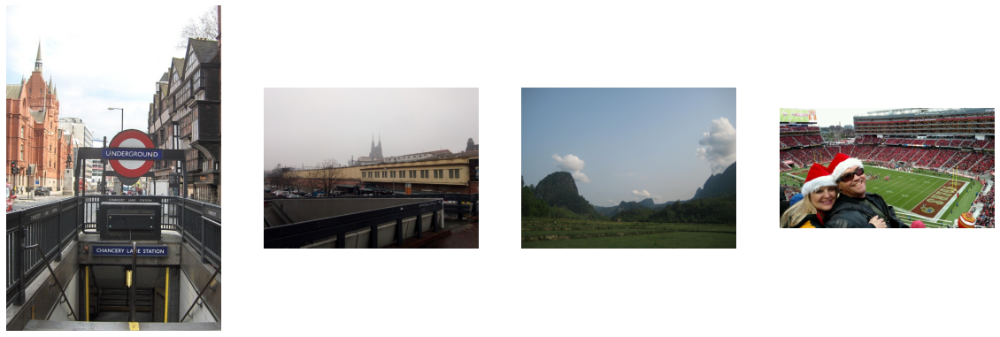

In [35]:
bottom_classes = (70439, 69521, 69272, 38892) # some bottom classes 
fig = plt.figure(figsize=(20,15))
img = [0] * len(bottom_classes) # a zeros array with bottom_classes len 
ax = [0] * len(bottom_classes)

for i, class_ in enumerate(bottom_classes):
    img[i] = cv2.imread(test_no_NaN_path_label_df[test_no_NaN_path_label_df.target == str(class_)]['image'].values[0])   
    img[i] = cv2.cvtColor(img[i], cv2.COLOR_BGR2RGB)
    ax[i] = fig.add_subplot(1, len(bottom_classes), i+1)
    ax[i].imshow(img[i])
    ax[i].axis('off')

As we can see from the graphs above, the top classes don't appear very often in the test set and a lot of classes appear only once in the train set. 

We would like to see how some images from the test set look like in the train set: 

In [19]:
# load the train data csv file as data frame 
train_df = pd.read_csv("C:/Users/Matan/Desktop/projectB/data/train/train.csv") 
train_path_label_dict = {'image': [], 'target': []}
# load train image path and labels as a dictionary and then convet to dataframe 
for i in range(train_df.shape[0]):
    train_path_label_dict['image'].append(
        "D:/dataset/train" + '/' + 
        train_df['id'][i][0] + '/' + 
        train_df['id'][i][1]+ '/' +
        train_df['id'][i][2]+ '/' +
        train_df['id'][i] + ".jpg")
    train_path_label_dict['target'].append(train_df['landmark_id'][i])

train_path_label_df = pd.DataFrame(train_path_label_dict)

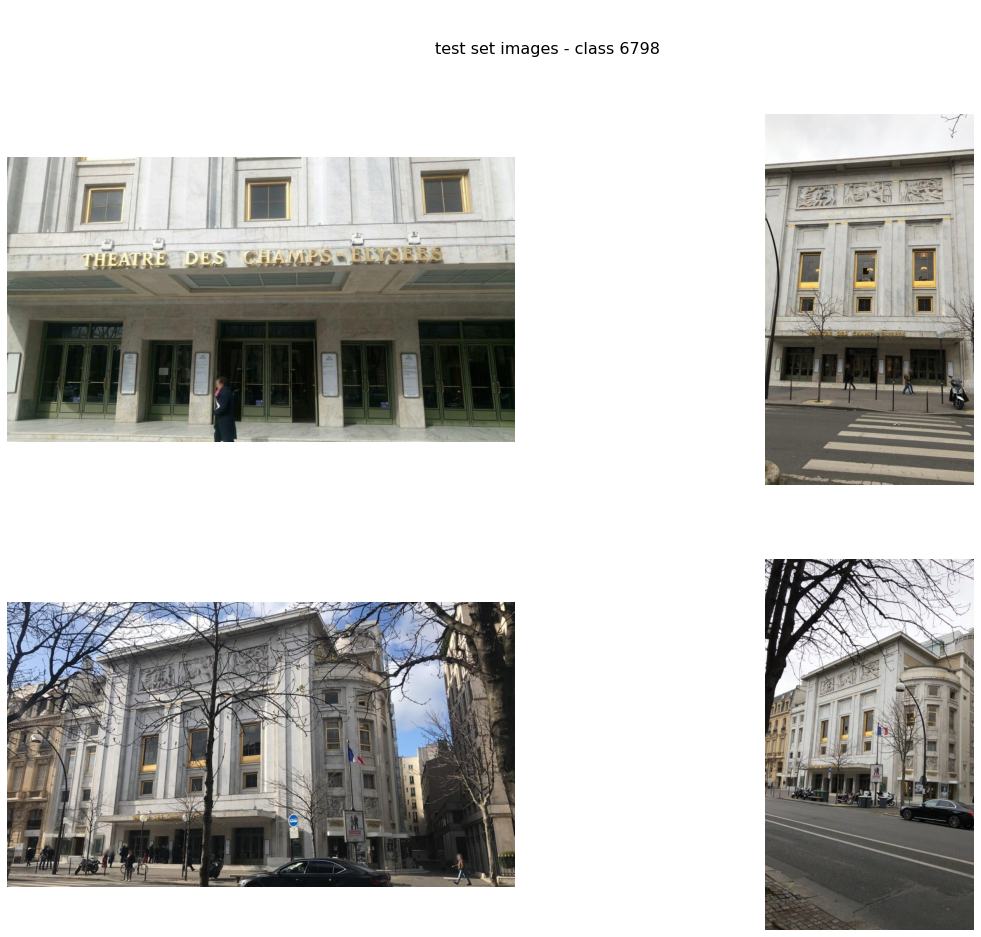

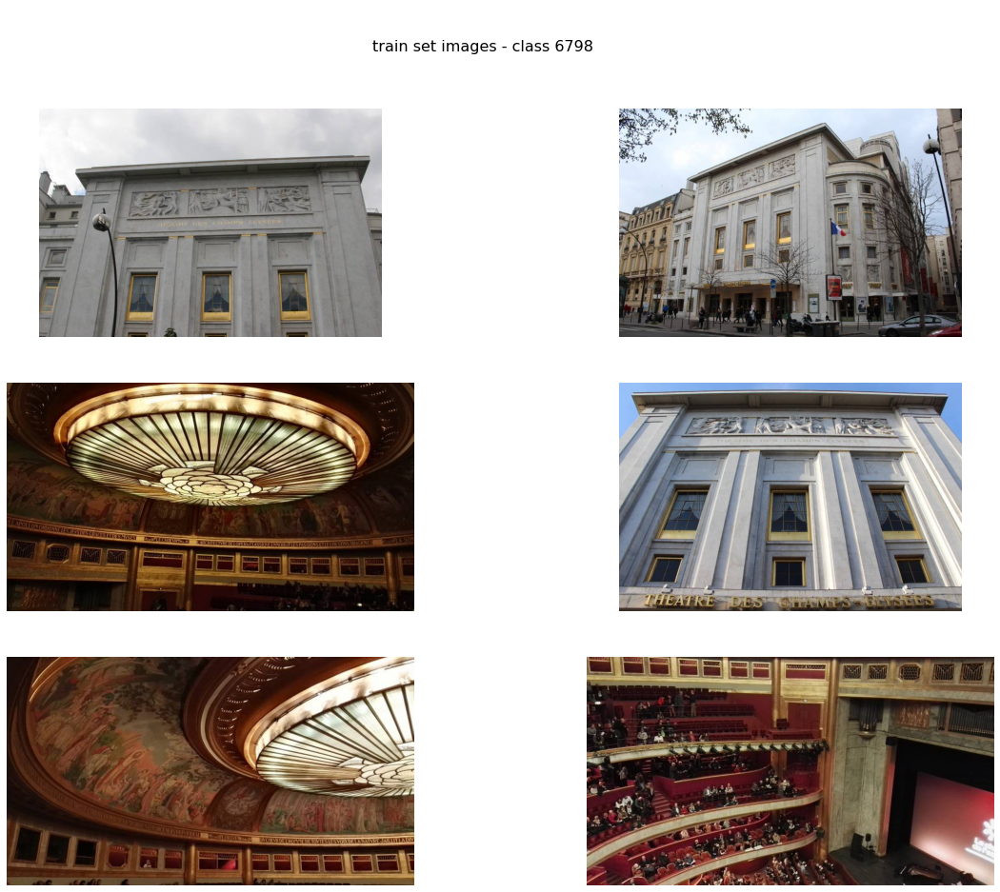

In [41]:
class_ = 6798

images_test = []      
for j in range(4):
    img_test = cv2.imread(test_no_NaN_path_label_df[test_no_NaN_path_label_df.target == str(class_)]['image'].values[j])   
    img_test = cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB)
    images_test.append(img_test)           
fig_test, ax_test = plt.subplots(2,2,figsize=(20,15))
fig_test.suptitle("\n\ntest set images - class {}".format(class_), fontsize=16)

for k, image_test in enumerate(images_test):        
    ax_test[k//2, k%2].imshow(image_test)
    ax_test[k//2, k%2].axis('off')

images_train = []
for i in range(6):
    img_train = cv2.imread(train_path_label_df[train_path_label_df.target == class_]['image'].values[i])   
    img_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2RGB)
    images_train.append(img_train)

fig_train, ax_train = plt.subplots(3,2, figsize=(20,15))
fig_train.suptitle("\n\ntrain set images - class {}".format(class_), fontsize=16)
for i, image_train in enumerate(images_train):        
        ax_train[i//2, i%2].imshow(image_train)
        ax_train[i//2, i%2].axis('off')

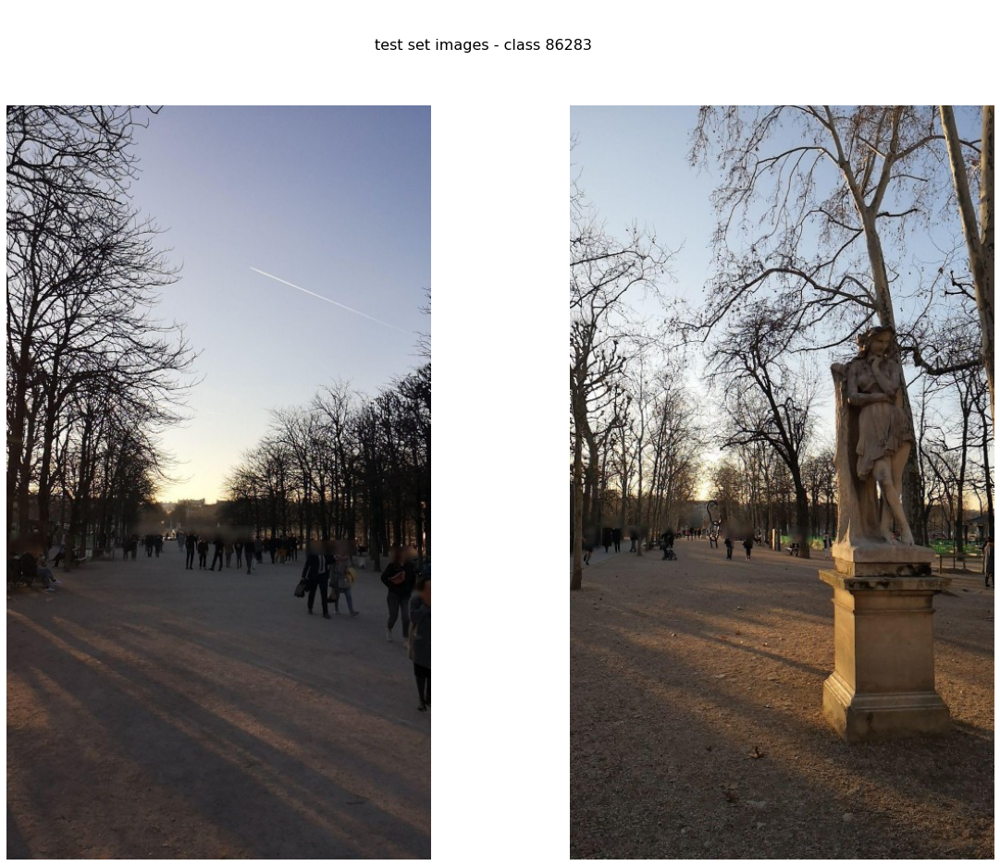

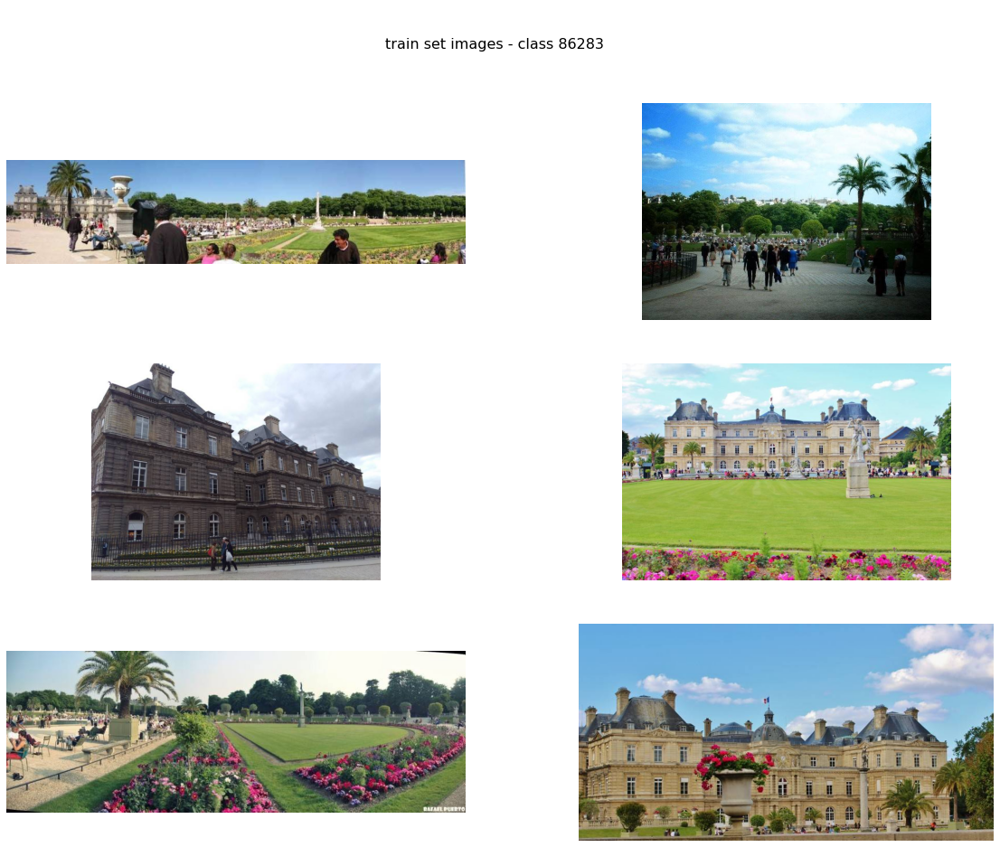

In [60]:
class_ = 86283

images_test = []      
for j in range(2):
    img_test = cv2.imread(test_no_NaN_path_label_df[test_no_NaN_path_label_df.target == str(class_)]['image'].values[j])   
    img_test = cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB)
    images_test.append(img_test)           
fig_test, ax_test = plt.subplots(1,2,figsize=(20,15))
fig_test.suptitle("\n\ntest set images - class {}".format(class_), fontsize=16)

for k, image_test in enumerate(images_test):        
    ax_test[k].imshow(image_test)
    ax_test[k].axis('off')

images_train = []
for i in range(6):
    img_train = cv2.imread(train_path_label_df[train_path_label_df.target == class_]['image'].values[i])   
    img_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2RGB)
    images_train.append(img_train)

fig_train, ax_train = plt.subplots(3,2, figsize=(20,15))
fig_train.suptitle("\n\ntrain set images - class {}".format(class_), fontsize=16)
for i, image_train in enumerate(images_train):        
        ax_train[i//2, i%2].imshow(image_train)
        ax_train[i//2, i%2].axis('off')

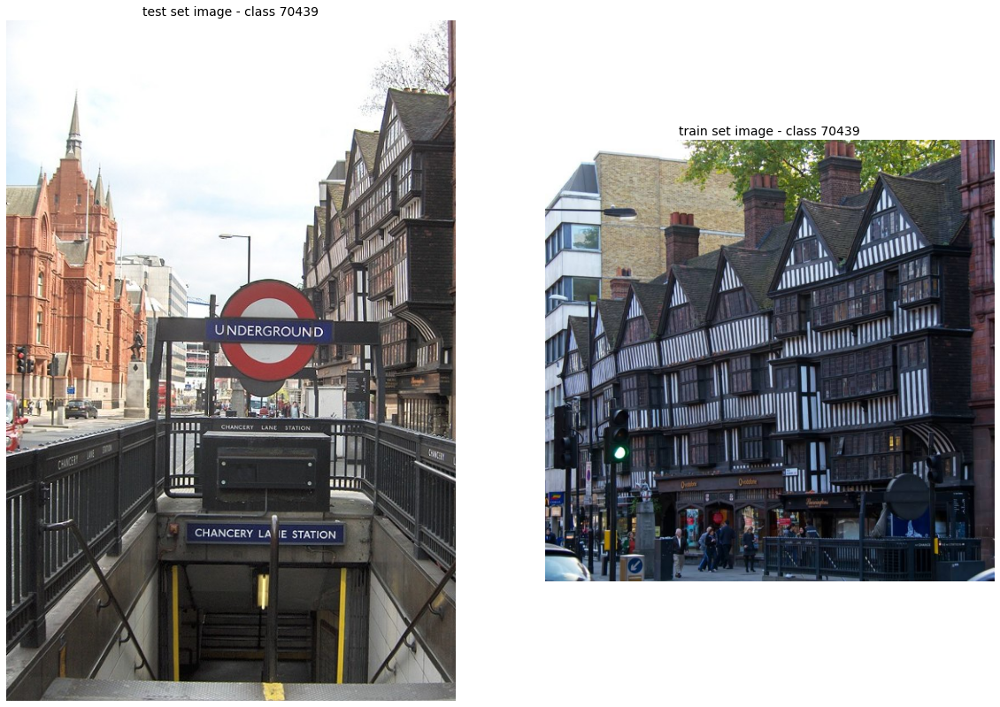

In [64]:
class_ = 70439

images = []      
img_test = cv2.imread(test_no_NaN_path_label_df[test_no_NaN_path_label_df.target == str(class_)]['image'].values[0])   
img_test = cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB)          
img_train = cv2.imread(train_path_label_df[train_path_label_df.target == class_]['image'].values[4])   
img_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2RGB)
images.append(img_test)
images.append(img_train)

fig_test, ax_test = plt.subplots(1,2,figsize=(20,15))
for k, image_test in enumerate(images):        
    ax_test[k].imshow(image_test)
    ax_test[k].axis('off')
ax_test[0].set_title("test set image - class {}".format(class_), fontsize=14)
ax_test[1].set_title("train set image - class {}".format(class_), fontsize=14)
plt.show()


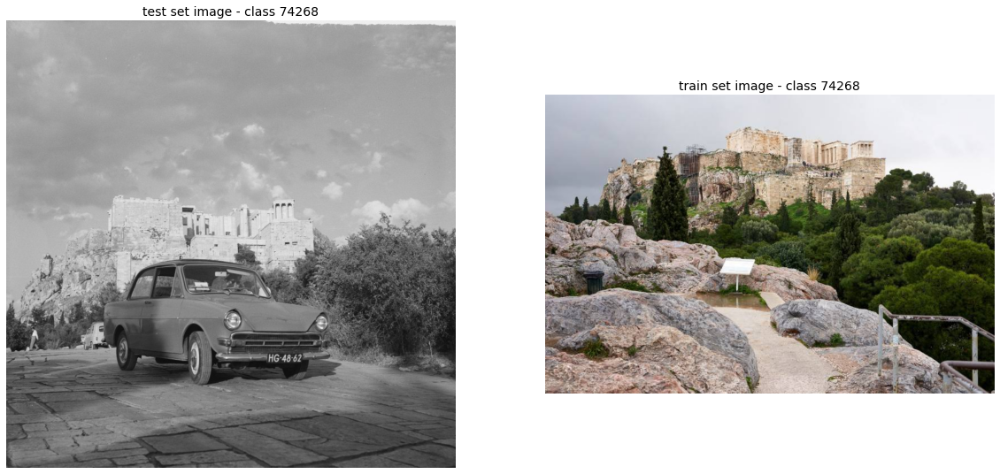

In [63]:
class_ = 74268

images = []      
img_test = cv2.imread(test_no_NaN_path_label_df[test_no_NaN_path_label_df.target == str(class_)]['image'].values[0])   
img_test = cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB)          
img_train = cv2.imread(train_path_label_df[train_path_label_df.target == class_]['image'].values[1])   
img_train = cv2.cvtColor(img_train, cv2.COLOR_BGR2RGB)
images.append(img_test)
images.append(img_train)

fig_test, ax_test = plt.subplots(1,2,figsize=(20,15))
for k, image_test in enumerate(images):        
    ax_test[k].imshow(image_test)
    ax_test[k].axis('off')
ax_test[0].set_title("test set image - class {}".format(class_), fontsize=14)
ax_test[1].set_title("train set image - class {}".format(class_), fontsize=14)
plt.show()


As we can see from the images above, somtimes the train and the test set images are not similar. They can differ in color, angel, brightness, lighting.

In class 6798 for example, the landmark is [theatre des champs elyses](https://www.google.com/search?q=theatre+des+champs+elysees&newwindow=1&rlz=1C1EJFC_enIL862IL862&sxsrf=ALeKk02jfuNtTKFMHvhyk-kAK1PQyvq47Q:1608134729048&source=lnms&tbm=isch&sa=X&ved=2ahUKEwjpg5ra8NLtAhXFrHEKHc5jAKUQ_AUoAXoECAsQAw&biw=1680&bih=907). The train set images include images of the theater from the inside and from the outside while the test images include only images from the inside. 

In class 86283, the landmark is [luxembourg gardens](https://www.google.com/search?q=luxembourg+gardens&newwindow=1&hl=iw&sxsrf=ALeKk000IukmB8hrcQONjVzGv-FIIZjJYg:1608136915828&source=lnms&tbm=isch&sa=X&ved=2ahUKEwjaxvjs-NLtAhViTRUIHS0kDyAQ_AUoAnoECBoQBA&biw=1680&bih=907). The train set images are images taken from all around the graden which is quite [big](https://www.google.com/maps?q=luxembourg+gardens&source=lmns&bih=907&biw=1680&hl=iw&sa=X&ved=2ahUKEwjewZTu-NLtAhWY_IUKHdj0C2cQ_AUoAnoECAEQAg) while it look like the test images are from one part of the park. 

In class 70439, the landmark is [chancery lane](https://www.google.com/search?q=chancery+lane&newwindow=1&rlz=1C1EJFC_enIL862IL862&sxsrf=ALeKk00_pvjJins-k9jmnG0oDhp13ZF69g:1608137220781&source=lnms&tbm=isch&sa=X&ved=2ahUKEwi5qa3--dLtAhULiFwKHeD-BvQQ_AUoAnoECAUQBA&biw=1680&bih=907). The train image include images from different part of the lane while the test image is a view of all the lane.

Those differences between the test set and the train set will make our recognition mission very difficult and non-trivial.  

This is the 2019 test set we will use to evaluate our algorithm.  